# **Brain MRI Segmentation**

## **1) Business Problem**

### **1.1) Problem Description**
A brain tumor is an abnormal mass of tissue in which cells grow and multiply abruptly, which remains unchecked by the mechanisms that control normal cells. Brain tumors are classified into benign tumors or low grade (grade I or II ) and malignant or high grade (grade III and IV). Benign tumors are non-cancerous and are considered to be non-progressive, their growth is relatively slow and limited. However, malignant tumors are cancerous and grow rapidly with undefined boundaries. So, early detection of brain tumors is very crucial for proper treatment and saving of human life.

Magnetic Resonance Imaging (MRI) of the brain is one of the best diagnostic imaging techniques used by neurologists for the detection of brain tumors. MRI images provide a lot of information about brain structure and abnormalities within brain tissues due to high-resolution images. In the past few decades, researchers have used different automated techniques for the detection of brain tumors using MRI images, as it is possible to scan and load these images in the computer for visual inspection. But recently, deep learning techniques have shown tremendous results and become the state of the art in the field of bioinformatics, medical informatics, and medical image analysis. In this post, I will discuss the detection of brain tumors from MRI scan images using a deep learning technique and compare the performance of different transfer learning approaches for the same.

### **1.2) Problem Statement**
The problem we are trying to solve is image segmentation. Image segmentation is the process of assigning a class label (such as person, car, or tree) to each pixel of an image. You can think of it as classification, but on a pixel level—instead of classifying the entire image under one label, we'll classify each pixel separately.

**Semantic segmentation:** This assigns a class to each pixel, but doesn't differentiate between object instances.

**Instance segmentation:** This assigns a class to each pixel and differentiates between object instances.

In our dataset we have image and its corresponding masks. So the problem we are exactly trying to solve is Semantic Image Segmentation.

### **1.3) Real World/ Business Objectives**
**Objective:**
The objective here is to predict the mask for the given Brain MRI image.

We'll use the dice coefficient to evaluate our semantic segmentation model.

### **1.4) Credits**
1) https://www.pyimagesearch.com/

2) https://opencv-python-tutroals.readthedocs.io/en/latest/index.html

3) https://www.kaggle.com/bonhart/brain-mri-data-visualization-unet-fpn

4) https://www.kaggle.com/monkira/brain-mri-segmentation-using-unet-keras

5) https://www.kaggle.com/bonhart/brain-mri-data-visualization-unet-fpn

6) https://learning.oreilly.com/library/view/practical-computer-vision/9781788297684/7a1a37ac-be76-4ec8-9a3b-4aa68a46951b.xhtml


## **2) Dataset Overview**

### **2.1) Dataset Description**
This dataset was used in Mateusz Buda, AshirbaniSaha, Maciej A. Mazurowski "Association of genomic subtypes of lower-grade gliomas with shape features automatically extracted by a deep learning algorithm." Computers in Biology and Medicine, 2019.

This dataset contains brain MR images together with manual FLAIR abnormality segmentation masks.

The images were obtained from The Cancer Imaging Archive (TCIA). They correspond to 110 patients included in The Cancer Genome Atlas (TCGA) lower-grade glioma collection with at least fluid-attenuated inversion recovery (FLAIR) sequence and genomic cluster data available.

Tumor genomic clusters and patient data is provided in data.csv file. The images are in .tif format


### **2.2) Imports and Necessary Functions**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import sys
import os
import random
import time
import gc

import numpy as np
import pandas as pd

import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid import ImageGrid
from google.colab.patches import cv2_imshow
from glob import glob


#plt.style.use("dark_background")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: 
The mpl_toolkits.axes_grid module was deprecated in Matplotlib 2.1 and will be removed two minor releases later. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist, which provide the same functionality instead.
  if sys.path[0] == '':


In [ ]:
DATA_PATH = "/content/drive/My Drive/case study/case study 2/lgg-mri-segmentation/kaggle_3m/"

#img size
IMG_SIZE = 512

In [ ]:
def plot_rgb_hist(image):
  
  '''
  This method will plot the histogram of the 
  RGB values of an image.
  -----------------------------------
  Arguments
  image - the image for which to plot the histogram
  -----------------------------------

  '''
  #extract the red channel
  im= image[:, :, 0]
  plt.hist(im.ravel(), bins = 256, \
           color = 'Red', alpha = 0.5)
  
  #extract the green color
  im= image[:, :, 1]
  plt.hist(im.ravel(), bins = 256, \
           color = 'Green', alpha = 0.5)
  
  #extract the blue color
  im= image[:, :, 2]
  plt.hist(im.ravel(), bins = 256, \
           color = 'Blue', alpha = 0.5)
  plt.show()

## **3) Exploratory Data Analysis and Pre-Processing**

### **3.1) Data Exploration**

In [ ]:
train_files = []
mask_files = glob(DATA_PATH +'*/*_mask*')

for i in mask_files:
    train_files.append(i.replace('_mask',''))

In [ ]:
df = pd.DataFrame()
df['train'] = train_files
df['mask'] = mask_files
df.head()

,train,mask
0,/content/drive/My Drive/case study/case study ...,/content/drive/My Drive/case study/case study ...
1,/content/drive/My Drive/case study/case study ...,/content/drive/My Drive/case study/case study ...
2,/content/drive/My Drive/case study/case study ...,/content/drive/My Drive/case study/case study ...
3,/content/drive/My Drive/case study/case study ...,/content/drive/My Drive/case study/case study ...
4,/content/drive/My Drive/case study/case study ...,/content/drive/My Drive/case study/case study ...


In [ ]:
len(df)

3929

There are a total of 3929 images with it's corresponding masks.

Let's find out how many tumor and non-tumor images. It is not explicitly given to us. However we can find it using the mask images.

Let's take a look at the mask image.

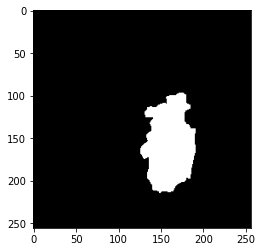

In [ ]:
i = cv2.imread(df['mask'].iloc[1])
plt.imshow(i)

The mask image has area covered in white where the tumor is present and black elsewhere.

So what we can do is we can find the maximum pixel value in the mask. If it is greater than 0 then we will mark it as 1 meaning has tumor.

In [ ]:
%%time
df['diag'] = 3
for i in range(len(df)):
  img = df['mask'].iloc[i]
  value = np.max(cv2.imread(img))
  if value > 0: 
    df['diag'].iloc[i] = 1
  else: 
    df['diag'].iloc[i] = 0
df.head()

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


CPU times: user 4.52 s, sys: 1.77 s, total: 6.29 s
Wall time: 12min 2s


In [ ]:
df.head()

,train,mask,diag
0,/content/drive/My Drive/case study/case study ...,/content/drive/My Drive/case study/case study ...,0
1,/content/drive/My Drive/case study/case study ...,/content/drive/My Drive/case study/case study ...,1
2,/content/drive/My Drive/case study/case study ...,/content/drive/My Drive/case study/case study ...,0
3,/content/drive/My Drive/case study/case study ...,/content/drive/My Drive/case study/case study ...,0
4,/content/drive/My Drive/case study/case study ...,/content/drive/My Drive/case study/case study ...,0


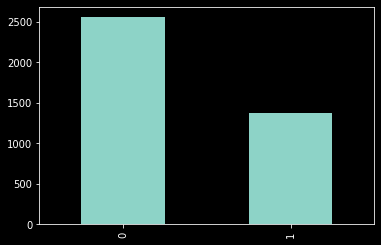

In [ ]:
df['diag'].value_counts().plot(kind='bar')

In [ ]:
df['diag'].value_counts()

0    2556
1    1373
Name: diag, dtype: int64

The data is somewhat imbalanced. We have a total of 2556 images with no tumor and 1373 images with tumor.

The following is the one of the image from the dataset.

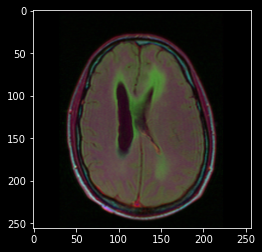

In [ ]:
img = cv2.imread(df['train'].iloc[0])
plt.imshow(img)

Let's visualize the MRI image and its correspoding mask.

The following is an example of an image with no tumor diagnosis.

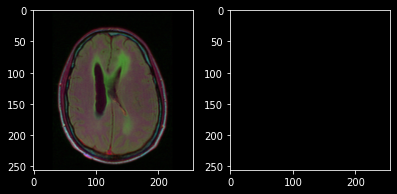

In [ ]:
fig=plt.figure(figsize=(10,10))

fig.add_subplot(1,2,1)
img = cv2.imread(df['train'].iloc[0])
plt.imshow(img)
fig.add_subplot(1,2,2)
msk = cv2.imread(df['mask'].iloc[0])
plt.imshow(msk)

The image on the left is the MRI and the image on the right is it's corresponding mask.

Let's visualized an image with tumor.

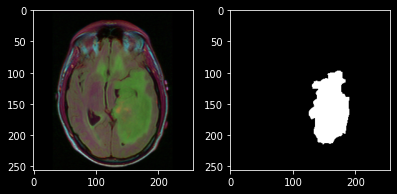

In [ ]:
fig=plt.figure(figsize=(10,10))

fig.add_subplot(1,2,1)
img = cv2.imread(df['train'].iloc[1])
plt.imshow(img)
fig.add_subplot(1,2,2)
msk = cv2.imread(df['mask'].iloc[1])
plt.imshow(msk)

The image on the left is the MRI and the one on the right is the mask image which represents where the tumor is in the MRI image.

The following is the mask overlayed on the MRI image.

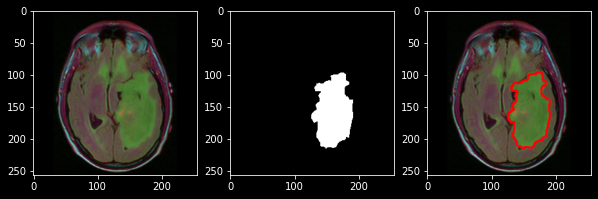

In [ ]:
fig=plt.figure(figsize=(10,10))

#plotting the image
fig.add_subplot(1,3,1)
img = cv2.imread(df['train'].iloc[1])
plt.imshow(img)

#plotting the mask
fig.add_subplot(1,3,2)
msk = cv2.imread(df['mask'].iloc[1])
plt.imshow(msk)

#plotting the mask overlayed on the image
fig.add_subplot(1,3,3)
#identify the edges using the CannyEdgeDetector
edged = cv2.Canny(msk, 10, 250)
#find the contours on the the image(edge detected)
(cnts, _) = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
#draw the contours
for cnt in cnts:
    cv2.drawContours(img,[cnt],0,(255,0,0),2)
plt.imshow(img)

Let's check whethe all the images have it's corresponding masks

In [ ]:
len(df['train']) == len(df['mask'])

True

Looks like all the images have its masks.

Now we'll crop the image and the mask so as to remove any noise. 

Before cropping any image we'll first need to enhance the contrast as some of the images are suffering from poor contrast.

For example take a look at the following image.

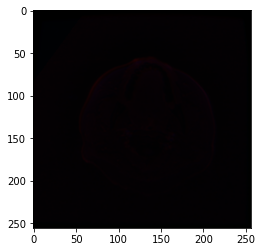

In [ ]:
img = cv2.imread(df['train'].iloc[3732])
plt.imshow(img)

The following is the histogram of the RGB values in the image.

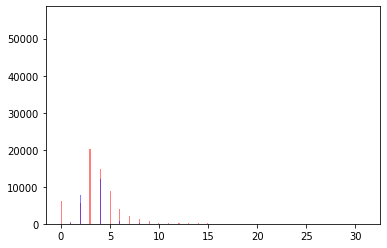

In [ ]:
plot_rgb_hist(img)

With our naked eye we cannot see anything in the above image. It's completely black. However if we print the gray scale of the image we can actually see the brain image.


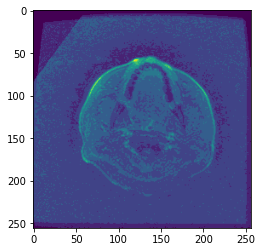

In [ ]:
gray = cv2.imread(df['train'].iloc[3732], 0)
plt.imshow(gray)

Now to enhance the contrast of the image. There are two popular methods.

1) Using histogram equalization

2) Using CLAHE(Contrast Limited Adaptive Histogram Equalization)

First we'll enhance using histogram equalization. Then we'll compare it with CLAHE.

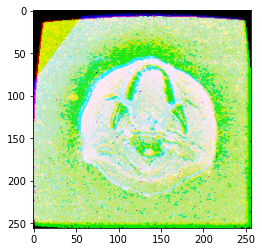

In [ ]:
#since this is a colour image we have to apply
#the histogram equalization on each of the three channels separately
#cv2.split will return the three channels in the order B, G, R
b,g,r = cv2.split(img)

#apply hist equ on the three channels separately
b = cv2.equalizeHist(b)
g = cv2.equalizeHist(g)
r = cv2.equalizeHist(r)

#merge all the three channels
equ = cv2.merge((b,g,r))

#convert it to RGB to visualize
equ = cv2.cvtColor(equ,cv2.COLOR_BGR2RGB);
plt.imshow(equ)

The following is the histogram of the RGB values in the image.

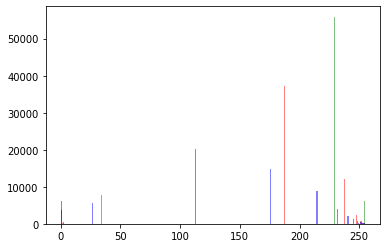

In [ ]:
plot_rgb_hist(equ)

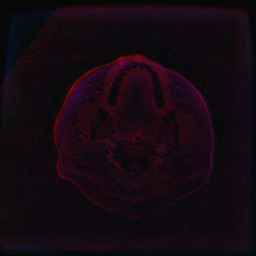

In [ ]:
#do the same as we did for histogram equalization
#set the clip value and the gridsize changing these values will give different output
clahe = cv2.createCLAHE(clipLimit=6, \
                    tileGridSize=(16,16))

#split the three channels
b,g,r = cv2.split(img)

#apply CLAHE on the three channels separately
b = clahe.apply(b)
g = clahe.apply(g)
r = clahe.apply(r)

#merge the three channels
bgr = cv2.merge((b,g,r))

#convert to RGB and plot
cl = cv2.cvtColor(bgr,cv2.COLOR_BGR2RGB);
cv2_imshow(cl)

The following is the histogram of the RGB values in the image.

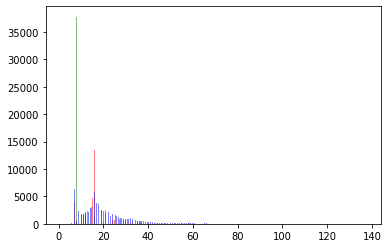

In [ ]:
plot_rgb_hist(cl)

From the results of both the histogram equalization and CLAHE we can conclude that CLAHE produce better result. The image which we got from histogram equalizer looks unnatural compared to CLAHE.

The output image from CLAHE is better since the details of the image is more clearer than histogram equalization. 

Now let's see how we can crop the image.

The following is the procedurce we'll follow to crop a image.

1) First we'll load the image.

2) Then we'll apply CLAHE to enhance the contrast of the image.

3) Once the contrast is enhanced we'll detect edges in the image.

4) Then we'll apply the dilate operation so as to remove small regions of noises.

5) Now we can find the contours in the image. Once we have the contours we'll find the extreme points in the contour and we will crop the image.

Original Image


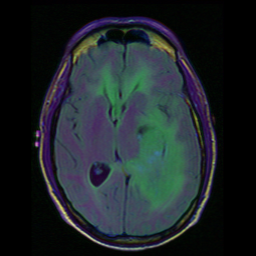



CLAHE Enhanced


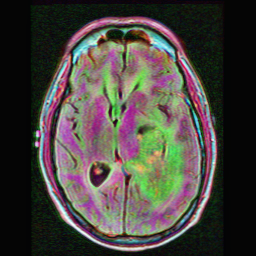



Edged Detected


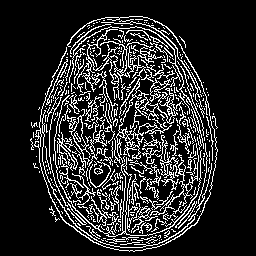



Dilated Image


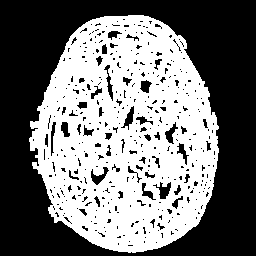



Contour


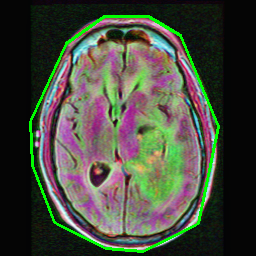



Cropped Image


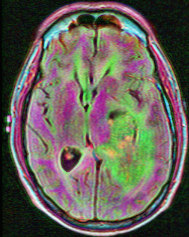

In [ ]:
#load an image from the dataset
img = cv2.imread(df['train'].iloc[15])
print('Original Image')
cv2_imshow(img)
print('\n')

#set the clip value and the gridsize changing these values will give different output
clahe = cv2.createCLAHE(clipLimit=4, \
                    tileGridSize=(16,16))

#split the three channels
b,g,r = cv2.split(img)

#apply CLAHE on the three channels separately
b = clahe.apply(b)
g = clahe.apply(g)
r = clahe.apply(r)

#merge the three channels
equ = cv2.merge((b,g,r))

#convert to RGB and plot
rgb = cv2.cvtColor(equ,cv2.COLOR_BGR2RGB);
imgc = rgb.copy()
print('CLAHE Enhanced')
cv2_imshow(rgb)
print('\n')
#Now we can now crop the image.
#to crop the image we'll first find the edges in the image.
edged = cv2.Canny(rgb, 10, 250)
print('Edged Detected')
cv2_imshow(edged)
print('\n')

#Once we have the edges now we'll perform dilate operation to remove any small regions of noises
dilate = cv2.dilate(edged, None, iterations=1)
print('Dilated Image')
cv2_imshow(dilate)
print('\n')

#Now we can find the contours in the image
(cnts, thres) = cv2.findContours(dilate.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

for c in cnts:
  peri = cv2.arcLength(c, True)
  eps = 0.01 * peri
  approx = cv2.approxPolyDP(c, eps, True)
  cv2.drawContours(imgc, [approx], -1, (0, 255, 0), 2)
print('Contour')
cv2_imshow(imgc)
print('\n')

#Now we'll get the extreme points in the contours and crop the image
#https://www.pyimagesearch.com/2016/04/11/finding-extreme-points-in-contours-with-opencv/
c = max(cnts, key=cv2.contourArea)

extLeft = tuple(c[c[:, :, 0].argmin()][0])
extRight = tuple(c[c[:, :, 0].argmax()][0])
extTop = tuple(c[c[:, :, 1].argmin()][0])
extBot = tuple(c[c[:, :, 1].argmax()][0])
new_image = rgb[extTop[1]:extBot[1], extLeft[0]:extRight[0]]
print('Cropped Image')
cv2_imshow(new_image)

The above example is for a single image. Similarly this processs of contrast enhancing and cropping will be applied on the whole dataset.

### **3.2) Data-Preprocessing**

In [ ]:
import cv2 
from google.colab.patches import cv2_imshow
from tqdm import tqdm
def crop_img():
#reading the image  
  z=[]
  for i in tqdm(range(len(df))):
    image = cv2.imread(df['train'].iloc[i])
    #gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    mask = cv2.imread(df['mask'].iloc[i])
    #imgc = image.copy()
    clahe = cv2.createCLAHE(clipLimit=4, \
                        tileGridSize=(16,16))
    b,g,r = cv2.split(image)

    #apply CLAHE on the three channels separately
    b = clahe.apply(b)
    g = clahe.apply(g)
    r = clahe.apply(r)

    #merge the three channels
    bgr = cv2.merge((b,g,r))

    #convert to RGB
    cl = cv2.cvtColor(bgr,cv2.COLOR_BGR2RGB)
    #edged = clahe.apply(gray_image) 
    imgc = cl.copy() 
    edged = cv2.Canny(cl, 10, 250)
    
    #cv2.waitKey(0) 

    #edged = cv2.erode(edged, None, iterations=1)
    edged = cv2.dilate(edged, None, iterations=2)
    
    #applying closing function
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))
    closed = cv2.morphologyEx(edged, cv2.MORPH_CLOSE, kernel)
    
    #finding_contours  
    (cnts, _) = cv2.findContours(closed.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE) 
    
    if len(cnts) == 0:    
      cv2.imwrite('/content/train/'+df['train'].iloc[i][-28:], imgc)
      cv2.imwrite('/content/mask/'+df['mask'].iloc[i][-33:], mask)
    else:
      c = max(cnts, key=cv2.contourArea)
      extLeft = tuple(c[c[:, :, 0].argmin()][0])
      extRight = tuple(c[c[:, :, 0].argmax()][0])
      extTop = tuple(c[c[:, :, 1].argmin()][0])
      extBot = tuple(c[c[:, :, 1].argmax()][0])
      new_image = imgc[extTop[1]:extBot[1], extLeft[0]:extRight[0]]
      mask = mask[extTop[1]:extBot[1], extLeft[0]:extRight[0]]

      cv2.imwrite('/content/train/'+df['train'].iloc[i][-28:], new_image)
      cv2.imwrite('/content/mask/'+df['mask'].iloc[i][-33:], mask)

In [ ]:
crop_img()

100%|██████████| 3929/3929 [1:27:17<00:00,  1.33s/it]


## **4) Training and Results**

### **4.1) Loading the images and the mask**

In [ ]:
images = []
image_path = glob('/content/drive/My Drive/case study/case study 2/train/*')

for i in image_path:
    images.append(i)

In [ ]:
len(images)

3929

In [ ]:
masks = []
mask_path = glob('/content/drive/My Drive/case study/case study 2/mask/*')

for i in mask_path:
  masks.append(i)


In [ ]:
len(masks)

3929

In [ ]:
df = pd.DataFrame()
df['img'] = images
df['mask'] = masks
df.head()

,img,mask
0,/content/drive/My Drive/case study/case study ...,/content/drive/My Drive/case study/case study ...
1,/content/drive/My Drive/case study/case study ...,/content/drive/My Drive/case study/case study ...
2,/content/drive/My Drive/case study/case study ...,/content/drive/My Drive/case study/case study ...
3,/content/drive/My Drive/case study/case study ...,/content/drive/My Drive/case study/case study ...
4,/content/drive/My Drive/case study/case study ...,/content/drive/My Drive/case study/case study ...


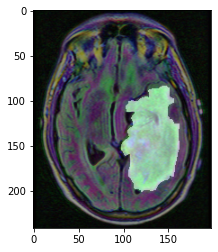

In [ ]:
img = cv2.imread('/content/drive/My Drive/case study/case study 2/train/TCGA_CS_5393_19990606_10.tif')
plt.imshow(img)
i = cv2.imread('/content/drive/My Drive/case study/case study 2/mask/TCGA_CS_5393_19990606_10_mask.tif')
plt.imshow(i, alpha=0.4)

In [ ]:
#splitting the dataset for training, validation, and testing.
from sklearn.model_selection import train_test_split

df_train, df_test = train_test_split(df,test_size = 0.1)
df_train, df_val = train_test_split(df_train,test_size = 0.2)

print(df_train.values.shape)
print(df_val.values.shape)
print(df_test.values.shape)

(2828, 2)
(708, 2)
(393, 2)


### **4.2) Image Augmentation**

Image Augmentation
To build a powerful image classifier using very little training data, image augmentation is usually required to boost the performance of deep networks. Image augmentation artificially creates training images through different ways of processing or combination of multiple processing, such as random rotation, shifts, shear and flips, etc.

In the following code snippet we'll create  data augmentation using keras data generator.

It can generate image and mask using the image_datagen and the mask_datagen using the same seed to ensure same transformation.

https://github.com/zhixuhao/unet/blob/master/data.py

In [ ]:
def train_generator(data_frame, batch_size, aug_dict,  image_color_mode="rgb",
        mask_color_mode="grayscale", image_save_prefix="image",
        mask_save_prefix="mask", save_to_dir=None,
        target_size=(256,256), seed=1):
    '''
    function to augment the image and mask.
    '''
    image_datagen = ImageDataGenerator(**aug_dict)
    mask_datagen = ImageDataGenerator(**aug_dict)
    
    image_generator = image_datagen.flow_from_dataframe(data_frame, x_col = "img", \
        class_mode = None, color_mode = image_color_mode, \
        target_size = target_size, batch_size = batch_size, \
        save_prefix  = image_save_prefix, seed = seed)

    mask_generator = mask_datagen.flow_from_dataframe(data_frame, x_col = "mask", \
        class_mode = None, color_mode = mask_color_mode, \
        target_size = target_size, batch_size = batch_size, \
        save_prefix  = mask_save_prefix, seed = seed)

    train_gen = zip(image_generator, mask_generator)
    
    for (img, mask) in train_gen:
        img, mask = adjust_data(img, mask)
        yield (img,mask)

def adjust_data(img,mask):
    img = img / 255
    mask = mask / 255
    mask[mask > 0.5] = 1
    mask[mask <= 0.5] = 0
    
    return (img, mask)

### **4.3) Defining Evaluation Metrics**

**Intersection over Union**

The Jaccard index, also known as Intersection over Union and the Jaccard similarity coefficient is a statistic used for gauging the similarity and diversity of sample sets. The Jaccard coefficient measures similarity between finite sample sets, and is defined as the size of the intersection divided by the size of the union of the sample sets:

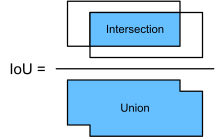

In [ ]:
from IPython.display import SVG 
SVG("/content/drive/My Drive/iou.svg")

**Dice coefficient**

The Dice score is not only a measure of how many positives you find, but it also penalizes for the false positives that the method finds, similar to precision. so it is more similar to precision than accuracy.
![dice](https://cdn-images-1.medium.com/max/1600/1*Z1hkDvyhFBogT9EkzVkX2A.png)

https://lars76.github.io/2018/09/27/loss-functions-for-segmentation.html

In [ ]:
smooth=100

def dice_coef(y_true, y_pred):
    y_truef=K.flatten(y_true)
    y_predf=K.flatten(y_pred)
    And=K.sum(y_truef* y_predf)
    return((2* And + smooth) / (K.sum(y_truef) + K.sum(y_predf) + smooth))

def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

def iou(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    sum_ = K.sum(y_true + y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return jac

def jac_distance(y_true, y_pred):
    y_truef=K.flatten(y_true)
    y_predf=K.flatten(y_pred)

    return - iou(y_true, y_pred)

### **4.4) Models**

#### **4.4.1) FULLY CONVOLUTIONAL NETWORK - FCN32**

https://arxiv.org/pdf/1411.4038.pdf

One of the popular models using CNN for segmentation is a fully convolutional network (FCN), which we will explore in this section. This method has the advantage of training an end-to-end CNN to perform pixel-wise semantic segmentation. 

Fully convolutional networks (FCNs) are based on the VGG-16 architecture, with the final dense layers replaced by 1 × 1 convolutions. The output is an image with each pixel classified as either background or into one of the predefined categories of objects. 

The overall architecture is shown in the following screenshot:
![dsf](https://learning.oreilly.com/library/view/practical-computer-vision/9781788297684/assets/49f5436a-4b06-4495-bee9-349d2a6c25cc.png)

With its five convolutional blocks, VGG-16 efficiently transforms images into feature maps, albeit dividing their spatial dimensions by two after each block. To decode the feature maps from the last block (for instance, into semantic masks), the fully connected layers used for classification are replaced by convolutional ones. 

The final layer is then applied – a transposed convolution to upsample the data back to the input shape (that is, with a stride of s = 32, since the spatial dimensions are divided by 32 through VGG)

In [ ]:
import tensorflow as tf
from skimage.color import rgb2gray
from tensorflow.keras import Input
from tensorflow.keras.models import Model, load_model, save_model
from tensorflow.keras.layers import Input, Activation, BatchNormalization, Dropout, Lambda, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, AveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [ ]:
#Set Parameters
im_width = 256
im_height = 256
EPOCHS = 100
BATCH_SIZE = 32
learning_rate = 1e-4

In [ ]:
from keras.applications.vgg16 import VGG16
from tensorflow.keras.callbacks import ReduceLROnPlateau

In [ ]:
def create_model_fcn32(n, input_w, input_h):
   
    """
    This function will create a Fully Convolutional Network(FCN32)
    and returns the model for training.

    -------------------------------------
    Arguments:
        n: number of classes to be detected
        input_w: width of the image
        input_h: height of the image
    --------------------------------------    
    """

    input = Input(shape=(input_w, input_h, 3))

    # initialize feature extractor excuding fully connected layers
    # here we use VGG model, with pre-trained weights. 
    vgg = VGG16(include_top=False, weights='imagenet', input_tensor=input)
    # create further network
    x = Conv2D(4096, kernel_size=(7,7), use_bias=False, \
               activation='relu', padding="same")(vgg.output)
    x = Dropout(0.5)(x)
    x = Conv2D(4096, kernel_size=(1,1), use_bias=False, \
               activation='relu', padding="same")(x)
    x = Dropout(0.5)(x)
    x = Conv2D(n, kernel_size=(1,1), use_bias=False, \ 
               padding="same")(x)
    # upsampling to image size
    x = Conv2DTranspose(n ,  kernel_size=(64,64), \
                        strides=(32,32), use_bias=False, padding='same')(x)
    x = Activation('sigmoid')(x)
    model = Model(input, x)
    return model

In [ ]:
fcn = create_model_fcn32(1, 256, 256)
fcn.summary()

Model: "functional_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 256, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 256, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 128, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 128, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 128, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 64, 64, 128)      

In [ ]:
es = EarlyStopping(monitor='val_loss', patience=11, verbose=1)
lrp = ReduceLROnPlateau(monitor='val_loss', factor=0.3,patience=3, min_lr=0.000001)

In [ ]:
#generate train and val images using ImageDataGenerator we created
train_generator_args = dict(rotation_range=0.2, width_shift_range=0.05, \
                            height_shift_range=0.05, shear_range=0.05, \
                            zoom_range=0.05, horizontal_flip=True, \
                            fill_mode='nearest')
train_gen = train_generator(df_train, BATCH_SIZE, train_generator_args, \
                                target_size=(im_height, im_width)) \

test_gener = train_generator(df_val, BATCH_SIZE, dict(), \
                                target_size=(im_height, im_width))

fcn = create_model_fcn32(1, 256)

decay_rate = learning_rate / EPOCHS
opt = Adam(lr=learning_rate, beta_1=0.9, beta_2=0.999, epsilon=None, decay=decay_rate, amsgrad=False)
fcn.compile(optimizer=opt, loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])

callbacks = [ModelCheckpoint('fcn.hdf5', verbose=1, save_best_only=True), es, lrp]

history = fcn.fit(train_gen,  steps_per_epoch=len(df_train) / BATCH_SIZE, \
                    epochs=EPOCHS, callbacks=callbacks, \ 
                    validation_data = test_gener, \
                    validation_steps=len(df_val) / BATCH_SIZE)

Found 2828 validated image filenames.
Found 2828 validated image filenames.
Epoch 1/100
89/88 [==============================] - ETA: 0s - loss: -0.0524 - binary_accuracy: 0.6031 - iou: 0.0272 - dice_coef: 0.0525Found 708 validated image filenames.
Found 708 validated image filenames.

Epoch 00001: val_loss improved from inf to -0.08266, saving model to unet_brain_mri_seg.hdf5
89/88 [==============================] - 111s 1s/step - loss: -0.0524 - binary_accuracy: 0.6031 - iou: 0.0272 - dice_coef: 0.0525 - val_loss: -0.0827 - val_binary_accuracy: 0.8186 - val_iou: 0.0431 - val_dice_coef: 0.0820
Epoch 2/100
89/88 [==============================] - ETA: 0s - loss: -0.1500 - binary_accuracy: 0.8629 - iou: 0.0823 - dice_coef: 0.1506
Epoch 00002: val_loss improved from -0.08266 to -0.19240, saving model to unet_brain_mri_seg.hdf5
89/88 [==============================] - 115s 1s/step - loss: -0.1500 - binary_accuracy: 0.8629 - iou: 0.0823 - dice_coef: 0.1506 - val_loss: -0.1924 - val_binary_

In [ ]:
!cp '/content/fcn.hdf5' -r '/content/drive/My Drive'

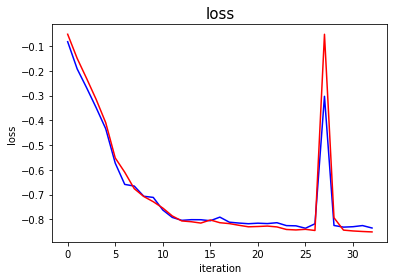

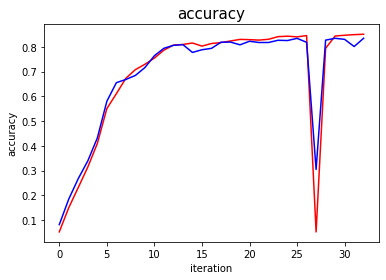

In [ ]:
hist = history.history

list_traindice = hist['dice_coef']
list_testdice = hist['val_dice_coef']

list_trainjaccard = hist['iou']
list_testjaccard = hist['val_iou']

list_trainloss = hist['loss']
list_testloss = hist['val_loss']

plt.figure(1)
plt.plot(list_testloss, 'b-')
plt.plot(list_trainloss,'r-')
plt.xlabel('iteration')
plt.ylabel('loss')
plt.title('loss', fontsize = 15)

plt.figure(2)
plt.plot(list_traindice, 'r-')
plt.plot(list_testdice, 'b-')
plt.xlabel('iteration')
plt.ylabel('accuracy')
plt.title('accuracy', fontsize = 15)
plt.show()


In [ ]:
#saving the history from model.fit
pd.DataFrame.from_dict(history.history).to_csv('history.csv',index=False)

In [ ]:
#loading the best model
model = load_model('fcn.hdf5', custom_objects={'dice_coef_loss': dice_coef_loss, 'iou': iou, 'dice_coef': dice_coef})

In [ ]:
#get the images for testing
test_gen = train_generator(df_test, BATCH_SIZE, dict(), \
                                target_size=(im_height, im_width))

#evaluate the model on the test data and print the results
results = model.evaluate(test_gen, steps=len(df_test) / BATCH_SIZE)

print("Test lost: ",results[0])
print("Test IOU: ",results[1])
print("Test Dice Coefficent: ",results[2])

Found 393 validated image filenames.
Found 393 validated image filenames.
13/12 [===============================] - 4s 313ms/step - loss: -0.8464 - binary_accuracy: 0.9957 - iou: 0.7289 - dice_coef: 0.8420
Test lost:  -0.8463581204414368
Test IOU:  0.9956779479980469
Test Dice Coefficent:  0.7288631200790405


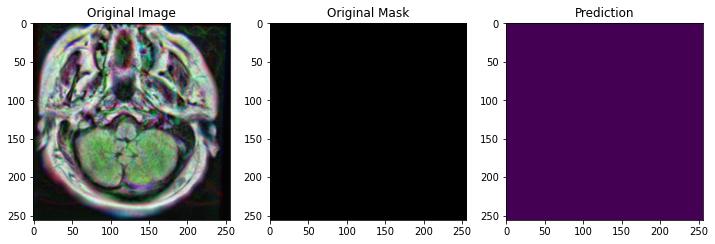

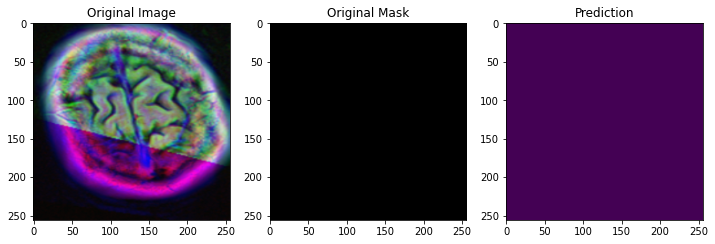

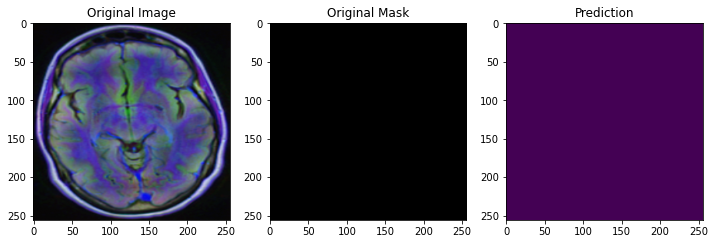

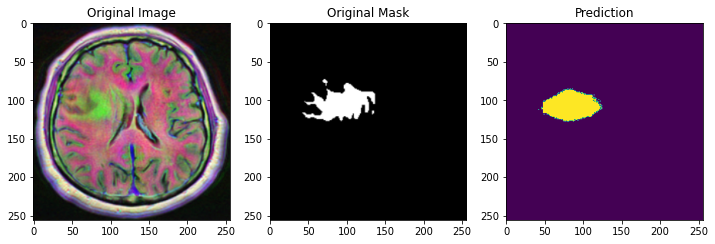

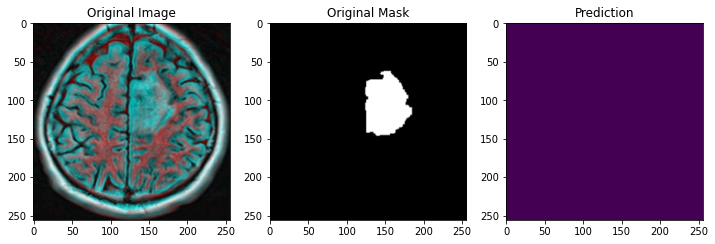

...

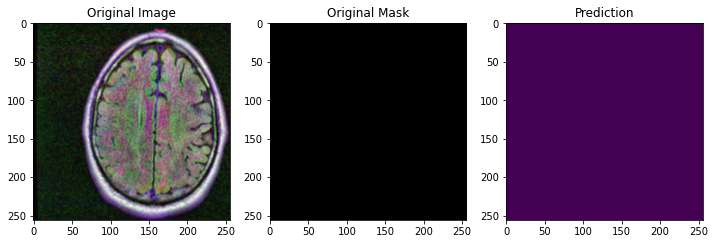

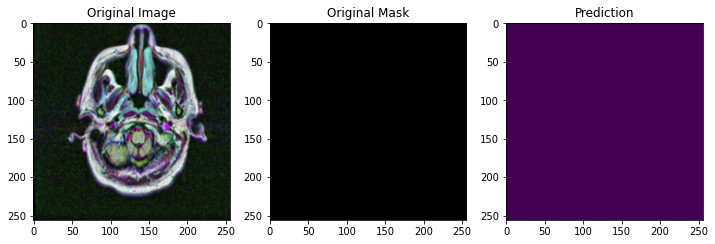

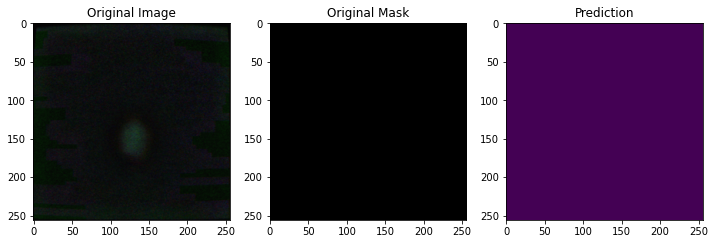

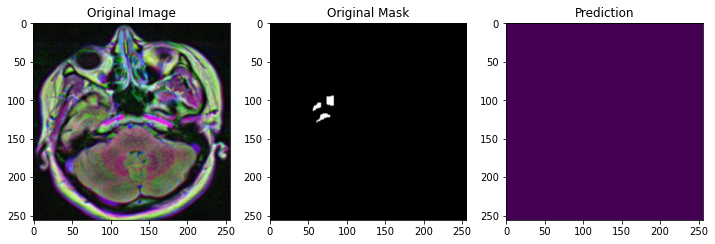

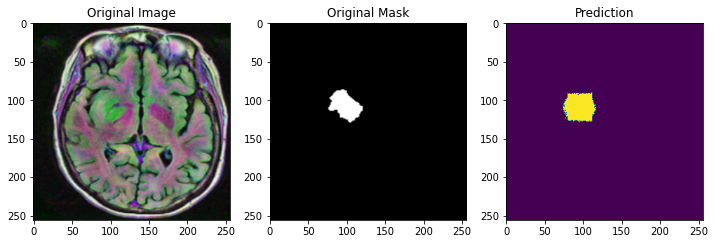

In [ ]:
np.random.seed(10)
for i in range(30):
    index=np.random.randint(1,len(df_test.index))
    img = cv2.imread(df_test['img'].iloc[index])
    img = cv2.resize(img ,(im_height, im_width))
    img = img / 255
    img = img[np.newaxis, :, :, :]
    pred=model.predict(img)

    plt.figure(figsize=(12,12))
    
    plt.subplot(1,3,1)
    plt.imshow(np.squeeze(img))
    plt.title('Original Image')
    
    plt.subplot(1,3,2)
    img = cv2.imread(df_test['mask'].iloc[index])
    img = cv2.resize(img, (im_height, im_width))
    plt.imshow(np.squeeze(img))
    plt.title('Original Mask')
    
    plt.subplot(1,3,3)
    plt.imshow(np.squeeze(pred) > .5)
    plt.title('Prediction')
    plt.show()

Now let's try a popular architecture called UNet which is a type of FCN developed primarily for medical imaging. 

#### **4.4.2) U-NET**

https://arxiv.org/pdf/1505.04597.pdf

U-Net is a type of fully convolutional network (FCN), called so because it contains only convolutional layers and doesn't have any fully connected layers. Among the solutions inspired by FCNs, the U-Net architecture is probably the most popular.

Developed for semantic segmentation mainly for medical imaging, it shares multiple properties with FCNs. It is also composed of a multi-block contractive encoder that increases the features' depth while reducing their spatial dimensions, and of an expansive decoder that recovers the image resolution. Moreover, like in FCNs, skip connections are used to connect encoding blocks to their decoding counterparts. 

The encoder is the first part of the network. It is similar to a regular CNN, without the fully connected layers at the end. The role of the encoder is to learn highly abstract representations of the input image.

The decoder is the second part of the network. It starts after the encoder and uses it as input. The role of the decoder is to translate these abstract representations into the segmented groundtruth data. To do this, the decoder uses the opposite of the encoder operations. This includes transposed convolutions (the opposite of convolutions) and unpooling (the opposite of pooling)
The decoding blocks are thus provided with both the contextual information from the preceding block and the location information from the encoding path.

![unet](https://learning.oreilly.com/library/view/advanced-deep-learning/9781789956177/assets/e64e443f-6ab9-4879-8f65-4640edd938c9.png)

In [ ]:
def unet(input_size=(256,256,3)):
    inputs = Input(input_size)
    
    conv1 = Conv2D(64, (3, 3), padding='same')(inputs)
    bn1 = Activation('relu')(conv1)
    conv1 = Conv2D(64, (3, 3), padding='same')(bn1)
    bn1 = BatchNormalization(axis=3)(conv1)
    bn1 = Activation('relu')(bn1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(bn1)

    conv2 = Conv2D(128, (3, 3), padding='same')(pool1)
    bn2 = Activation('relu')(conv2)
    conv2 = Conv2D(128, (3, 3), padding='same')(bn2)
    bn2 = BatchNormalization(axis=3)(conv2)
    bn2 = Activation('relu')(bn2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(bn2)

    conv3 = Conv2D(256, (3, 3), padding='same')(pool2)
    bn3 = Activation('relu')(conv3)
    conv3 = Conv2D(256, (3, 3), padding='same')(bn3)
    bn3 = BatchNormalization(axis=3)(conv3)
    bn3 = Activation('relu')(bn3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(bn3)

    conv4 = Conv2D(512, (3, 3), padding='same')(pool3)
    bn4 = Activation('relu')(conv4)
    conv4 = Conv2D(512, (3, 3), padding='same')(bn4)
    bn4 = BatchNormalization(axis=3)(conv4)
    bn4 = Activation('relu')(bn4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(bn4)

    conv5 = Conv2D(1024, (3, 3), padding='same')(pool4)
    bn5 = Activation('relu')(conv5)
    conv5 = Conv2D(1024, (3, 3), padding='same')(bn5)
    bn5 = BatchNormalization(axis=3)(conv5)
    bn5 = Activation('relu')(bn5)

    up6 = concatenate([Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(bn5), conv4], axis=3)
    conv6 = Conv2D(512, (3, 3), padding='same')(up6)
    bn6 = Activation('relu')(conv6)
    conv6 = Conv2D(512, (3, 3), padding='same')(bn6)
    bn6 = BatchNormalization(axis=3)(conv6)
    bn6 = Activation('relu')(bn6)

    up7 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(bn6), conv3], axis=3)
    conv7 = Conv2D(256, (3, 3), padding='same')(up7)
    bn7 = Activation('relu')(conv7)
    conv7 = Conv2D(256, (3, 3), padding='same')(bn7)
    bn7 = BatchNormalization(axis=3)(conv7)
    bn7 = Activation('relu')(bn7)

    up8 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(bn7), conv2], axis=3)
    conv8 = Conv2D(128, (3, 3), padding='same')(up8)
    bn8 = Activation('relu')(conv8)
    conv8 = Conv2D(128, (3, 3), padding='same')(bn8)
    bn8 = BatchNormalization(axis=3)(conv8)
    bn8 = Activation('relu')(bn8)

    up9 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(bn8), conv1], axis=3)
    conv9 = Conv2D(64, (3, 3), padding='same')(up9)
    bn9 = Activation('relu')(conv9)
    conv9 = Conv2D(64, (3, 3), padding='same')(bn9)
    bn9 = BatchNormalization(axis=3)(conv9)
    bn9 = Activation('relu')(bn9)

    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(bn9)

    return Model(inputs=[inputs], outputs=[conv10])

In [ ]:
model = unet()
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
activation (Activation)         (None, 256, 256, 64) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 64) 36928       activation[0][0]                 
_______________________________________________________________________________________

In [ ]:
#Set Parameters
im_width = 256
im_height = 256
EPOCHS = 100
BATCH_SIZE = 32
learning_rate = 1e-4

In [ ]:
#early stopping callback
es = EarlyStopping(monitor='val_loss', patience=7, verbose=1)

In [ ]:
train_generator_args = dict(rotation_range=0.2, width_shift_range=0.05, \
                            height_shift_range=0.05, shear_range=0.05, \
                            zoom_range=0.05, horizontal_flip=True, \
                            fill_mode='nearest')

train_gen = train_generator(df_train, BATCH_SIZE, train_generator_args, \
                                target_size=(im_height, im_width))
    
test_gener = train_generator(df_val, BATCH_SIZE, dict(), \
                                target_size=(im_height, im_width))
    
model = unet(input_size=(im_height, im_width, 3))


opt = Adam(lr=learning_rate, beta_1=0.9, beta_2=0.999, epsilon=None, \
           decay=learning_rate / EPOCHS, amsgrad=False)
model.compile(optimizer=opt, loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])

callbacks = [ModelCheckpoint('unet_brain_mri_seg.hdf5', verbose=1, save_best_only=True), es]

history = model.fit(train_gen, steps_per_epoch=len(df_train) / BATCH_SIZE,  \
                    epochs=EPOCHS, callbacks=callbacks, \
                    validation_data = test_gener, \
                    validation_steps=len(df_val) / BATCH_SIZE)

Found 2828 validated image filenames.
Found 2828 validated image filenames.
Epoch 1/100
89/88 [==============================] - ETA: -5s - loss: -0.1239 - binary_accuracy: 0.8621 - iou: 0.0678 - dice_coef: 0.1249Found 708 validated image filenames.
Found 708 validated image filenames.

Epoch 00001: val_loss improved from inf to -0.03435, saving model to unet_brain_mri_seg.hdf5
89/88 [==============================] - 969s 11s/step - loss: -0.1239 - binary_accuracy: 0.8621 - iou: 0.0678 - dice_coef: 0.1249 - val_loss: -0.0344 - val_binary_accuracy: 0.9670 - val_iou: 0.0171 - val_dice_coef: 0.0334
Epoch 2/100
89/88 [==============================] - ETA: 0s - loss: -0.2133 - binary_accuracy: 0.9790 - iou: 0.1212 - dice_coef: 0.2136
Epoch 00002: val_loss did not improve from -0.03435
89/88 [==============================] - 136s 2s/step - loss: -0.2133 - binary_accuracy: 0.9790 - iou: 0.1212 - dice_coef: 0.2136 - val_loss: -0.0298 - val_binary_accuracy: 0.9832 - val_iou: 0.0153 - val_dic

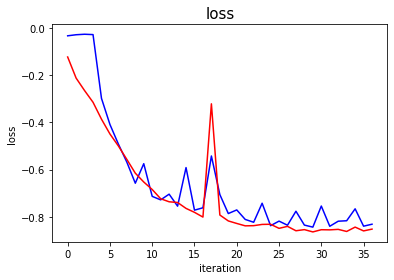

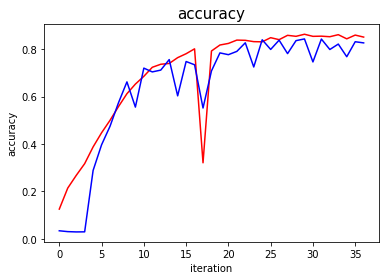

In [ ]:
hist = history.history

list_traindice = hist['dice_coef']
list_testdice = hist['val_dice_coef']

list_trainjaccard = hist['iou']
list_testjaccard = hist['val_iou']

list_trainloss = hist['loss']
list_testloss = hist['val_loss']

plt.figure(1)
plt.plot(list_testloss, 'b-')
plt.plot(list_trainloss,'r-')
plt.xlabel('iteration')
plt.ylabel('loss')
plt.title('loss', fontsize = 15)

plt.figure(2)
plt.plot(list_traindice, 'r-')
plt.plot(list_testdice, 'b-')
plt.xlabel('iteration')
plt.ylabel('accuracy')
plt.title('accuracy', fontsize = 15)
plt.show()

In [ ]:
pd.DataFrame.from_dict(history.history).to_csv('history.csv',index=False)

In [ ]:
model = load_model('unet_brain_mri_seg.hdf5', custom_objects={'dice_coef_loss': dice_coef_loss, 'iou': iou, 'dice_coef': dice_coef})

In [ ]:
test_gen = train_generator(df_test, BATCH_SIZE, dict(), \
                           target_size=(im_height, im_width))

results = model.evaluate(test_gen, steps=len(df_test) / BATCH_SIZE)

print("Test lost: ",results[0])
print("Test IOU: ",results[1])
print("Test Dice Coefficent: ",results[2])

Found 393 validated image filenames.
Found 393 validated image filenames.
13/12 [===============================] - 82s 6s/step - loss: -0.8439 - binary_accuracy: 0.9946 - iou: 0.7324 - dice_coef: 0.8439
Test lost:  -0.8438678979873657
Test IOU:  0.9946414232254028
Test Dice Coefficent:  0.7323826551437378


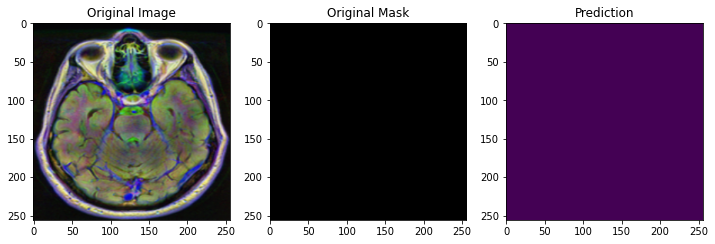

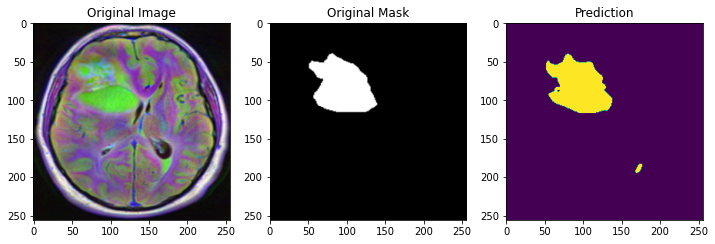

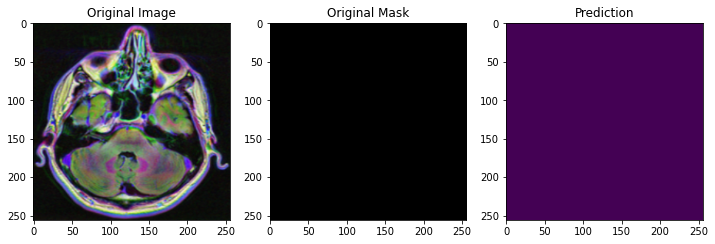

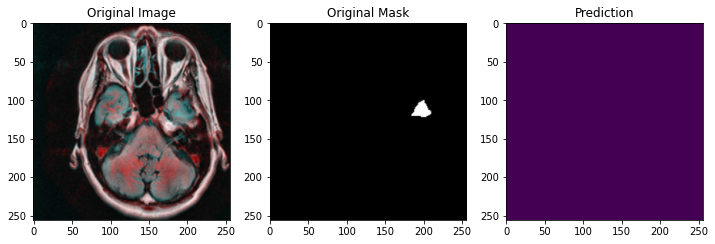

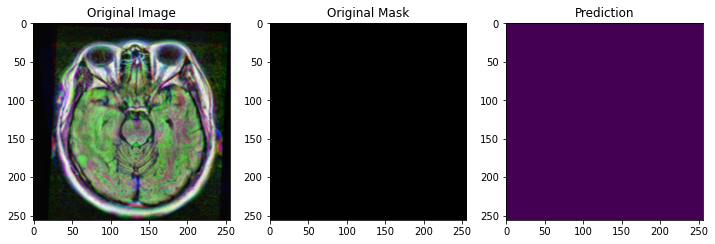

...

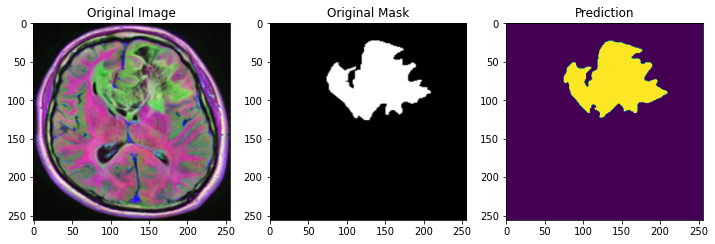

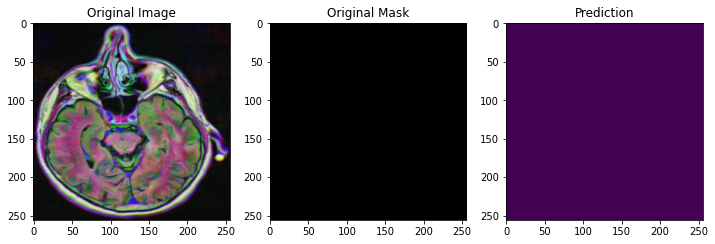

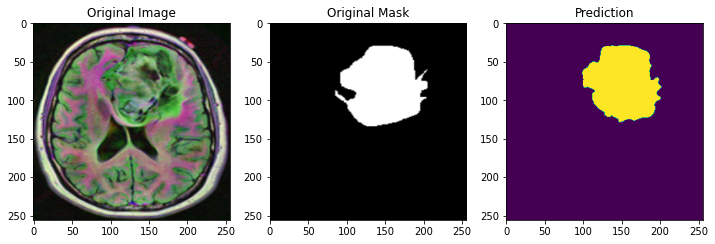

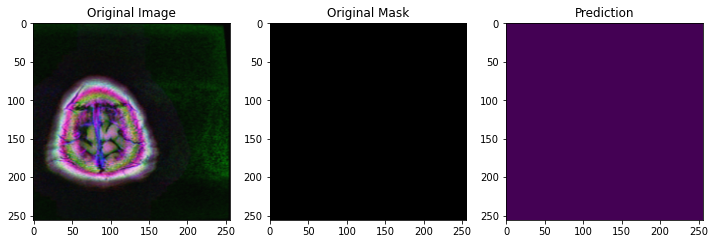

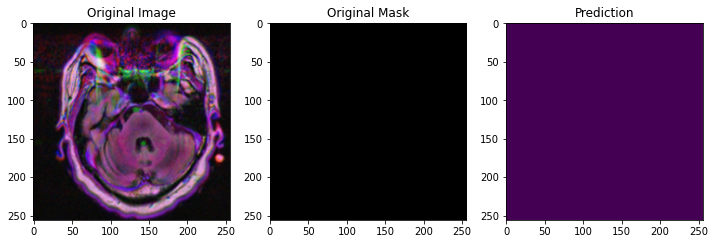

In [ ]:
np.random.seed(10)
for i in range(30):
    index=np.random.randint(1,len(df_test.index))
    img = cv2.imread(df_test['img'].iloc[index])
    img = cv2.resize(img ,(im_height, im_width))
    img = img / 255
    img = img[np.newaxis, :, :, :]
    pred=model.predict(img)

    plt.figure(figsize=(12,12))
    plt.subplot(1,3,1)
    plt.imshow(np.squeeze(img))
    plt.title('Original Image')

    plt.subplot(1,3,2)
    img = cv2.imread(df_test['mask'].iloc[index])
    img = cv2.resize(img, (im_height, im_width))
    plt.imshow(np.squeeze(img))
    plt.title('Original Mask')
    
    plt.subplot(1,3,3)
    plt.imshow(np.squeeze(pred) > .5)
    plt.title('Prediction')
    plt.show()


Comparing to the simple FCN network, the U-NET does a pretty good job. It can identify most of the tumors accurately.

Now let's try another version of UNET called RESUNET

#### **4.4.3) ResUNet**

https://arxiv.org/pdf/1711.10684.pdf

ResUNet, a concept of semant segmentation inspired by the deep residual learning and UNet. ResUNet architecture takes advantage of both Residual and UNet models.

The proposed deep residual U-Net (ResUnet) is built based on the architecture
of U-Net. The differences between our deep ResUnet and UNet are in two-fold. First, we use residual units instead of
plain neural units as basic blocks to build the deep ResUnet.

![res](https://github.com/nikhilroxtomar/Deep-Residual-Unet/raw/e250c2f5bb1a260cbe7bed6b7232d7b8b20fe1a2/images/arch.png)

In [ ]:
# Defining functions which will be used to create the model

def conv(x, filters, kernel_size=(3, 3), strides=1):
    ''' 
    This function will create the ConvBlock and return it
    Arguments:
    -----------------------------
    x - previous 
    filters - value for the filters
    kernel_size - size of the kernels default value is (3,3)
    strides - size of the strids default value is 1
    ------------------------------
    '''

    conv = keras.layers.BatchNormalization()(x)
    conv = keras.layers.Activation('relu')(conv)
    conv = keras.layers.Conv2D(filters, kernel_size, padding='same', strides=strides)(conv)
    return conv

def res(x, filters, strides=1):
    '''
    This function will create the residual block and returns it.
    Arguments:
    ----------------------
    x - previous 
    filters - size of the filters
    strides - size of the strides default value 1
    ----------------------
    '''

    r = conv(x, filters, kernel_size=(3, 3), strides=strides)
    r = conv(r, filters, kernel_size=(3, 3), strides=1)
    
    shortcut = keras.layers.Conv2D(filters, kernel_size=(1, 1), padding="same", strides=strides)(x)
    shortcut = keras.layers.BatchNormalization()(shortcut)

    output = keras.layers.Add()([shortcut, r])
    return output

In [ ]:
def ResUNet():
    '''
    This function will create the ResUNet model and returns it.
    '''

    inputs = keras.layers.Input((256, 256, 3))
    enc0 = inputs
    c = keras.layers.Conv2D(16, (3, 3), padding="same", strides=1)(enc0)
    c2 = conv(c, 16, kernel_size=(3, 3), strides=1)
    s = keras.layers.Conv2D(16, kernel_size=(1, 1), padding="same", strides=1)(enc0)
    s2 = keras.layers.BatchNormalization()(s)
    
    enc1 = keras.layers.Add()([c2, s2])
    enc2 = res(enc1, 32, strides=2)
    enc3 = res(enc2, 64, strides=2)
    enc4 = res(enc3, 128, strides=2)
    enc5 = res(enc4, 256, strides=2)
    
    b0 = conv(enc5, 256, strides=1)
    b1 = conv(b0, 256, strides=1)
    
    upsamp1 = keras.layers.UpSampling2D((2, 2))(b1)
    upsamp1 = keras.layers.Concatenate()([upsamp1, enc4])
    dec1 = res(upsamp1, 256)
    
    upsamp2 = keras.layers.UpSampling2D((2, 2))(dec1)
    upsamp2 = keras.layers.Concatenate()([upsamp2, enc3])
    dec2 = res(upsamp2, 128)
    
    upsamp3 = keras.layers.UpSampling2D((2, 2))(dec2)
    upsamp3 = keras.layers.Concatenate()([upsamp3, enc2])
    dec3 = res(upsamp3, 64)
    
    upsamp4 = keras.layers.UpSampling2D((2, 2))(dec3)
    upsamp4 = keras.layers.Concatenate()([upsamp4, enc1])
    dec4 = res(upsamp4, 32)
    outputs = keras.layers.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(dec4)
    model = keras.models.Model(inputs, outputs)
    return model

In [ ]:
import keras
model = ResUNet()
model.summary()

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_33 (Conv2D)              (None, 256, 256, 16) 448         input_3[0][0]                    
__________________________________________________________________________________________________
batch_normalization_30 (BatchNo (None, 256, 256, 16) 64          conv2d_33[0][0]                  
__________________________________________________________________________________________________
activation_20 (Activation)      (None, 256, 256, 16) 0           batch_normalization_30[0][0]     
_______________________________________________________________________________________

In [ ]:
model = ResUNet()
opt = Adam(lr=learning_rate, beta_1=0.9, beta_2=0.999, epsilon=None, \
           decay=learning_rate / EPOCHS, amsgrad=False)
model.compile(optimizer=opt, loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])

callbacks = [ModelCheckpoint('resunet.hdf5', verbose=1, save_best_only=True), es]

history = model.fit(train_gen, steps_per_epoch=len(df_train) / BATCH_SIZE, \
                    epochs=EPOCHS, callbacks=callbacks, \
                    validation_data = test_gener, \
                    validation_steps=len(df_val) / BATCH_SIZE)

Epoch 1/100
89/88 [==============================] - ETA: 0s - loss: -0.3447 - binary_accuracy: 0.9187 - iou: 0.2324 - dice_coef: 0.3484
Epoch 00001: val_loss improved from inf to -0.02894, saving model to unet_brain_mri_seg.hdf5
89/88 [==============================] - 100s 1s/step - loss: -0.3447 - binary_accuracy: 0.9187 - iou: 0.2324 - dice_coef: 0.3484 - val_loss: -0.0289 - val_binary_accuracy: 0.9839 - val_iou: 0.0147 - val_dice_coef: 0.0281
Epoch 2/100
89/88 [==============================] - ETA: 0s - loss: -0.6252 - binary_accuracy: 0.9889 - iou: 0.4670 - dice_coef: 0.6240
Epoch 00002: val_loss did not improve from -0.02894
89/88 [==============================] - 95s 1s/step - loss: -0.6252 - binary_accuracy: 0.9889 - iou: 0.4670 - dice_coef: 0.6240 - val_loss: -0.0066 - val_binary_accuracy: 0.9833 - val_iou: 0.0060 - val_dice_coef: 0.0078
Epoch 3/100
89/88 [==============================] - ETA: 0s - loss: -0.6857 - binary_accuracy: 0.9909 - iou: 0.5331 - dice_coef: 0.6865
E

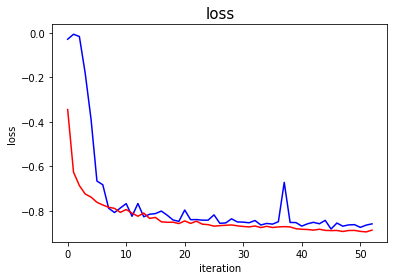

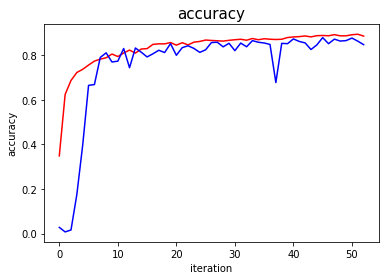

In [ ]:
hist = history.history

list_traindice = hist['dice_coef']
list_testdice = hist['val_dice_coef']

list_trainjaccard = hist['iou']
list_testjaccard = hist['val_iou']

list_trainloss = hist['loss']
list_testloss = hist['val_loss']

plt.figure(1)
plt.plot(list_testloss, 'b-')
plt.plot(list_trainloss,'r-')
plt.xlabel('iteration')
plt.ylabel('loss')
plt.title('loss', fontsize = 15)

plt.figure(2)
plt.plot(list_traindice, 'r-')
plt.plot(list_testdice, 'b-')
plt.xlabel('iteration')
plt.ylabel('accuracy')
plt.title('accuracy', fontsize = 15)
plt.show()


In [ ]:
pd.DataFrame.from_dict(history.history).to_csv('history_resunet.csv',index=False)

In [ ]:
model = load_model('resunet.hdf5', custom_objects={'dice_coef_loss': dice_coef_loss, 'iou': iou, 'dice_coef': dice_coef})

In [ ]:
test_gen = train_generator(df_test, BATCH_SIZE, dict(), \
                            target_size=(im_height, im_width))
results = model.evaluate(test_gen, steps=len(df_test) / BATCH_SIZE)

print("Test lost: ",results[0])
print("Test IOU: ",results[1])
print("Test Dice Coefficent: ",results[2])

Found 393 validated image filenames.
Found 393 validated image filenames.
13/12 [===============================] - 175s 13s/step - loss: -0.8825 - binary_accuracy: 0.9961 - iou: 0.7915 - dice_coef: 0.8825
Test lost:  -0.8824889063835144
Test IOU:  0.9960554838180542
Test Dice Coefficent:  0.7915199995040894


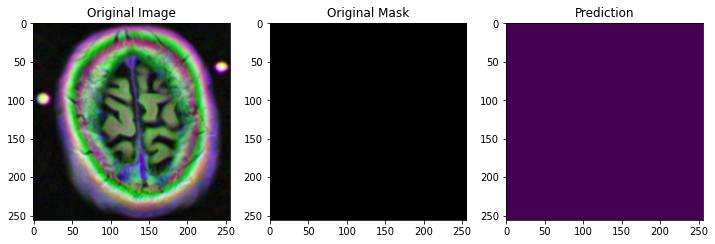

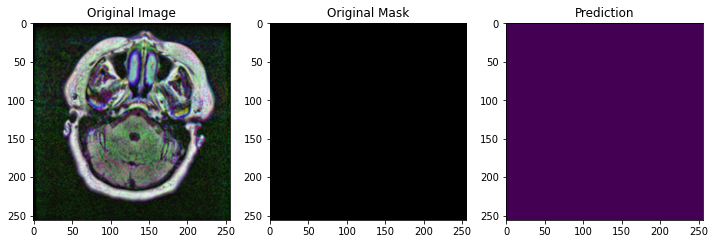

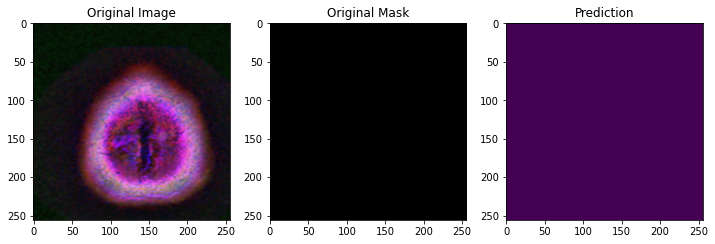

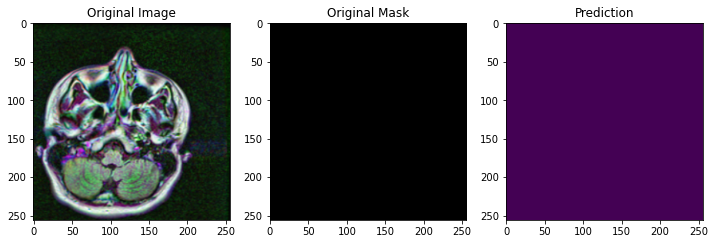

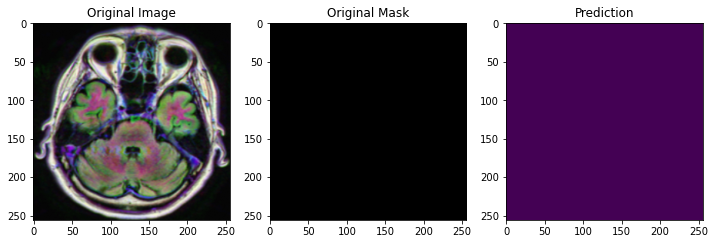

...

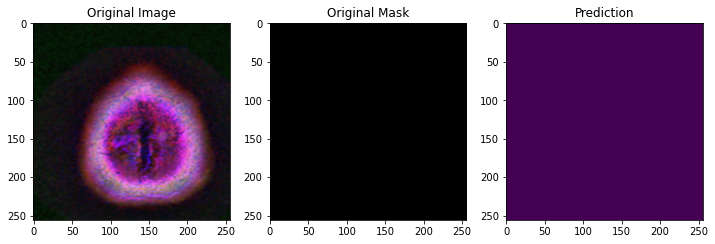

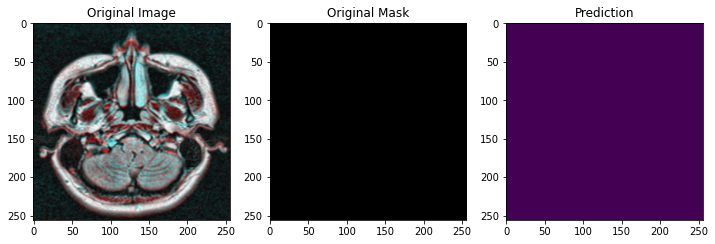

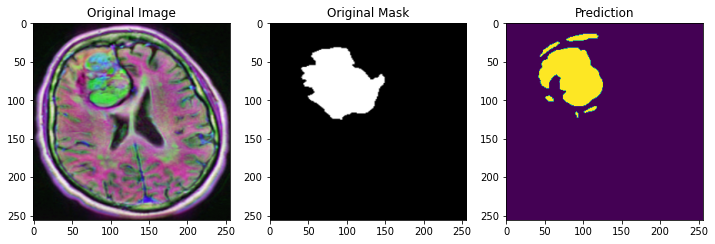

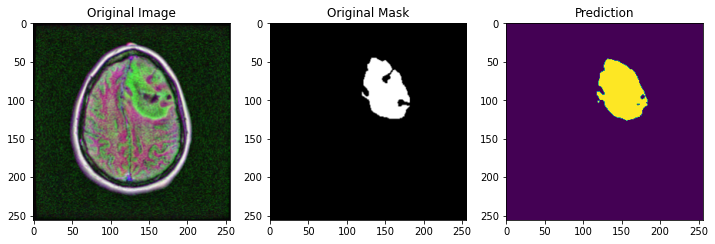

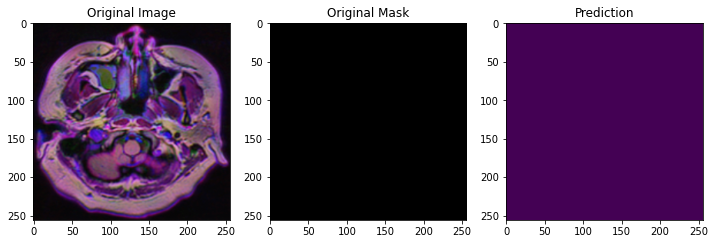

In [ ]:
np.random.seed(11)
for i in range(30):
    index=np.random.randint(1,len(df_test.index))
    img = cv2.imread(df_test['img'].iloc[index])
    img = cv2.resize(img ,(im_height, im_width))
    img = img / 255
    img = img[np.newaxis, :, :, :]
    pred=model.predict(img)

    plt.figure(figsize=(12,12))
    plt.subplot(1,3,1)
    plt.imshow(np.squeeze(img))
    plt.title('Original Image')
    plt.subplot(1,3,2)
    img = cv2.imread(df_test['mask'].iloc[index])
    img = cv2.resize(img, (im_height, im_width))
    plt.imshow(np.squeeze(img))
    plt.title('Original Mask')
    plt.subplot(1,3,3)
    plt.imshow(np.squeeze(pred) > .5)
    plt.title('Prediction')
    plt.show()


#### **4.4.4) Comparison of Models**

In [ ]:
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Models", "Test loss", "Test IOU", "Test Dice"]
x.add_row(["FCN\n", -0.8463581204414368, 0.9956779479980469, 0.7288631200790405])
x.add_row(["UNet\n", -0.8438678979873657, 0.9946414232254028, 0.7323826551437378])
x.add_row(["ResUNet\n", -0.8824889063835144, 0.9960554838180542, 0.7915199995040894])
print(x)

+---------+---------------------+--------------------+--------------------+
|  Models |      Test loss      |      Test IOU      |     Test Dice      |
+---------+---------------------+--------------------+--------------------+
|   FCN   | -0.8463581204414368 | 0.9956779479980469 | 0.7288631200790405 |
|         |                     |                    |                    |
|   UNet  | -0.8438678979873657 | 0.9946414232254028 | 0.7323826551437378 |
|         |                     |                    |                    |
| ResUNet | -0.8824889063835144 | 0.9960554838180542 | 0.7915199995040894 |
|         |                     |                    |                    |
+---------+---------------------+--------------------+--------------------+


Out of all the three models the ResUNet outperforms the other two models.

However one thing which looks sketchy in the numbers is the Test IOU values. They are almost perfect. This could be because the non-tumor area is large when compared to the tumorous one.

So to confirm that the high Test IOU is not because of that let's calculate the IOU values for the tumor and non-tumour images separately.

## **5) Testing whether the Test IOU is biased**

### **5.1) Splitting the dataset into tumor and non_tumor**

Creating a new column diag and mark 1 for image which has tumor and 0 for image which has no tumor

In [ ]:
%%time
#create a new colum diag and assign it any value
df_test['diag'] = 3

#loop through the test set and check whether
#the maximum value of the mask is greater than 0. If it is greater
#than 0 mark it as 1 to denote tumour image.
for i in range(len(df_test)):
  img = df_test['mask'].iloc[i]
  value = np.max(cv2.imread(img))
  if value > 0: 
    df_test['diag'].iloc[i] = 1
  else: 
    df_test['diag'].iloc[i] = 0
df_test.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/inde

CPU times: user 487 ms, sys: 97.6 ms, total: 585 ms
Wall time: 1.18 s


In [ ]:
df_test.head()

,img,mask
463,/content/drive/My Drive/train/TCGA_HT_7856_199...,/content/drive/My Drive/mask/TCGA_HT_7856_1995...
680,/content/drive/My Drive/train/TCGA_HT_A5RC_199...,/content/drive/My Drive/mask/TCGA_HT_A5RC_1999...
2878,/content/drive/My Drive/train/TCGA_DU_7309_199...,/content/drive/My Drive/mask/TCGA_DU_7309_1996...
3418,/content/drive/My Drive/train/TCGA_DU_5853_199...,/content/drive/My Drive/mask/TCGA_DU_5853_1995...
76,/content/drive/My Drive/train/TCGA_FG_A4MT_200...,/content/drive/My Drive/mask/TCGA_FG_A4MT_2002...


In [ ]:
df_test.head()

,img,mask,diag
463,/content/drive/My Drive/train/TCGA_HT_7856_199...,/content/drive/My Drive/mask/TCGA_HT_7856_1995...,1
680,/content/drive/My Drive/train/TCGA_HT_A5RC_199...,/content/drive/My Drive/mask/TCGA_HT_A5RC_1999...,0
2878,/content/drive/My Drive/train/TCGA_DU_7309_199...,/content/drive/My Drive/mask/TCGA_DU_7309_1996...,0
3418,/content/drive/My Drive/train/TCGA_DU_5853_199...,/content/drive/My Drive/mask/TCGA_DU_5853_1995...,1
76,/content/drive/My Drive/train/TCGA_FG_A4MT_200...,/content/drive/My Drive/mask/TCGA_FG_A4MT_2002...,1


In [ ]:
tumor = df_test[df_test['diag']==1]
tumor.shape

(128, 3)

In [ ]:
tumor.head()

,img,mask,diag
463,/content/drive/My Drive/train/TCGA_HT_7856_199...,/content/drive/My Drive/mask/TCGA_HT_7856_1995...,1
3418,/content/drive/My Drive/train/TCGA_DU_5853_199...,/content/drive/My Drive/mask/TCGA_DU_5853_1995...,1
76,/content/drive/My Drive/train/TCGA_FG_A4MT_200...,/content/drive/My Drive/mask/TCGA_FG_A4MT_2002...,1
1501,/content/drive/My Drive/train/TCGA_FG_6688_200...,/content/drive/My Drive/mask/TCGA_FG_6688_2002...,1
1947,/content/drive/My Drive/train/TCGA_HT_7473_199...,/content/drive/My Drive/mask/TCGA_HT_7473_1997...,1


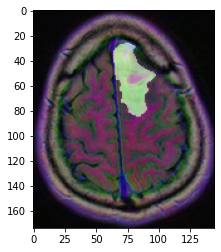

In [ ]:
i = cv2.imread(tumor['img'].iloc[0])
plt.imshow(i)
m = cv2.imread(tumor['mask'].iloc[0])
plt.imshow(m, alpha=0.4)

In [ ]:
no_tumor = df_test[df_test['diag']==0]
no_tumor.shape

(265, 3)

In [ ]:
no_tumor.head()

,img,mask,diag
680,/content/drive/My Drive/train/TCGA_HT_A5RC_199...,/content/drive/My Drive/mask/TCGA_HT_A5RC_1999...,0
2878,/content/drive/My Drive/train/TCGA_DU_7309_199...,/content/drive/My Drive/mask/TCGA_DU_7309_1996...,0
2988,/content/drive/My Drive/train/TCGA_DU_A5TW_199...,/content/drive/My Drive/mask/TCGA_DU_A5TW_1998...,0
2772,/content/drive/My Drive/train/TCGA_DU_7299_199...,/content/drive/My Drive/mask/TCGA_DU_7299_1991...,0
3365,/content/drive/My Drive/train/TCGA_CS_6666_200...,/content/drive/My Drive/mask/TCGA_CS_6666_2001...,0


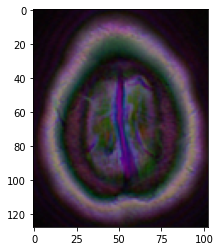

In [ ]:
i = cv2.imread(no_tumor['img'].iloc[0])
plt.imshow(i)
m = cv2.imread(no_tumor['mask'].iloc[0])
plt.imshow(m, alpha=0.4)

### **5.2) Loading the ResUNet model and testing on the two sets separately**

In [ ]:
model = load_model('/content/drive/My Drive/resunet.hdf5', custom_objects={'dice_coef_loss': dice_coef_loss, 'iou': iou, 'dice_coef': dice_coef})

#### **5.2.1) On the tumor data**

In [ ]:
test_gen = train_generator(tumor, BATCH_SIZE, dict(), \
                            target_size=(im_height, im_width))
results = model.evaluate(test_gen, steps=len(tumor) / BATCH_SIZE)

print("Test lost: ",results[0])
print("Test IOU: ",results[1])
print("Test Dice Coefficent: ",results[2])

Found 128 validated image filenames.
Found 128 validated image filenames.
4/4 [==============================] - 44s 11s/step - loss: -0.9025 - binary_accuracy: 0.9909 - iou: 0.8231 - dice_coef: 0.9025
Test lost:  -0.9025251865386963
Test IOU:  0.9909100532531738
Test Dice Coefficent:  0.8230627179145813


#### **5.2.2) On the non-tumor data**

In [ ]:
test_gen = train_generator(no_tumor, BATCH_SIZE, dict(), \
                            target_size=(im_height, im_width))
results = model.evaluate(test_gen, steps=len(no_tumor) / BATCH_SIZE)

print("Test lost: ",results[0])
print("Test IOU: ",results[1])
print("Test Dice Coefficent: ",results[2])

Found 265 validated image filenames.
Found 265 validated image filenames.
9/8 [================================] - 100s 11s/step - loss: -0.6658 - binary_accuracy: 0.9997 - iou: 0.6920 - dice_coef: 0.6920
Test lost:  -0.6657878756523132
Test IOU:  0.999748945236206
Test Dice Coefficent:  0.6919592618942261


### **5.3) Comparing the metrics**

In [ ]:
!pip install PTable

In [ ]:
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Data","Test loss", "Test IOU", "Test Dice"]
x.add_row(["Tumor\n", -0.9025251865386963, 0.9909100532531738, 0.8230627179145813])
x.add_row(["No Tumor\n", -0.6657878756523132, 0.999748945236206, 0.6919592618942261])
x.add_row(["Old Metrics on the \nWhole Data\n", -0.8824889063835144 , 0.9960554838180542 , 0.7915199995040894])
x.title = "ResUNet on Tumor and Non-Tumor data separately"
print(x)

+-------------------------------------------------------------------------------------+
|                    ResUNet on Tumor and Non-Tumor data separately                   |
+---------------------+---------------------+--------------------+--------------------+
|         Data        |      Test loss      |      Test IOU      |     Test Dice      |
+---------------------+---------------------+--------------------+--------------------+
|        Tumor        | -0.9025251865386963 | 0.9909100532531738 | 0.8230627179145813 |
|                     |                     |                    |                    |
|       No Tumor      | -0.6657878756523132 | 0.999748945236206  | 0.6919592618942261 |
|                     |                     |                    |                    |
| Old Metrics on the  | -0.8824889063835144 | 0.9960554838180542 | 0.7915199995040894 |
|      Whole Data     |                     |                    |                    |
|                     |         

## **6) Tensorflow Input Pipeline**

### **6.1) Preparing the dataset**

In [ ]:
!pip install tensorflow-io
import tensorflow_io as tfio

In [ ]:
def parse_function(filename, label):
    '''
    This function reads the image and its corresponding mask
    and perform operatios like converting the dtype to float32,
    resizing the image and return the image and the mask.
    Arguments
    -----------------------
    filename - the image path
    label    - the mask path
    ------------------------
    '''

    #reading the image and the label
    image_string = tf.io.read_file(filename)
    label_string = tf.io.read_file(label)

    #decoding the image using the decode_tiff from tensorflow experimental
    image = tfio.experimental.image.decode_tiff(image_string)
    label = tfio.experimental.image.decode_tiff(label_string)

    #convert the image to float32
    #this inherently normalizes the image
    #so we don't have to normalize the values separately
    image = tf.image.convert_image_dtype(image, tf.float32)
    label = tf.image.convert_image_dtype(label, tf.float32)

    #resizing the images to 256x256
    resized_image = tf.image.resize(image, [256, 256])
    resized_label = tf.image.resize(label, [256, 256])
    if tf.random.uniform(()) > 0.5:
        resized_image = tf.image.flip_left_right(resized_image)
        resized_label = tf.image.flip_left_right(resized_label)

    #setting the channels 3 for the image and 1 for the mask
    resized_image = tf.convert_to_tensor(resized_image[:,:,:3])
    resized_label = tf.convert_to_tensor(resized_label[:,:,:1])
    
    return resized_image, resized_label

In [ ]:
#preparing the training dataset
train_dataset = tf.data.Dataset.from_tensor_slices((train_x, train_y))
train_dataset = train_dataset.shuffle(len(train_x))
train_dataset = train_dataset.map(parse_function, num_parallel_calls=4)
train_dataset = train_dataset.batch(32)
train_dataset = train_dataset.prefetch(1)

In [ ]:
#preparing the validation dataset
valid_dataset = tf.data.Dataset.from_tensor_slices((valid_x, valid_y))
valid_dataset = valid_dataset.shuffle(len(valid_x))
valid_dataset = valid_dataset.map(parse_function, num_parallel_calls=4)
valid_dataset = valid_dataset.batch(32)
valid_dataset = valid_dataset.prefetch(1)

In [ ]:
#preparing the testing dataset
test_dataset = tf.data.Dataset.from_tensor_slices((test_x, test_y))
test_dataset = test_dataset.shuffle(len(test_x))
test_dataset = test_dataset.map(parse_function, num_parallel_calls=4)
test_dataset = test_dataset.batch(32)
test_dataset = test_dataset.prefetch(1)

In [ ]:
for x, y in train_dataset.take(1):
  print('Train Image shape:', x.shape)
  print('Train Mask shape:', y.shape)

Train Image shape: (32, 256, 256, 3)
Train Mask shape: (32, 256, 256, 1)


### **6.2) Model Training (ResUNet)**

In [ ]:
#set hyperparameters
import keras
im_width = 256
im_height = 256
batch = 32
lr = 1e-4
epochs = 100

In [ ]:
#defining callbacks

#early stopping to stop the training when the val_loss stops improving after certain epochs
es = EarlyStopping(monitor='val_loss', patience=11)

#reduce the learning rate once the val_loss stops improving after certain epochs
rlr =  ReduceLROnPlateau(monitor = "val_loss", factor = 0.5, patience = 5,
                        verbose = 10, mode = "auto", min_delta = 1e-04, cooldown = 0,
                        min_lr = 1e-5)

#save the best model
model_filename = "test-Epoch-{epoch:02d}"
checkpoint_path = os.path.join('models/', model_filename)
cpt = ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False)

In [ ]:
#creating the model
model = ResUNet()

#initializing the optimizer and compiling the model
opt = Adam(lr=learning_rate, beta_1=0.9, beta_2=0.999, epsilon=None, \
           decay=learning_rate / EPOCHS, amsgrad=False)
model.compile(optimizer=opt, loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])

#defining the training steps
train_steps = len(train_x)//batch
valid_steps = len(valid_x)//batch
if len(train_x) % batch != 0:
    train_steps += 1
if len(valid_x) % batch != 0:
    valid_steps += 1

#make a list of callbacks
callbacks = [cpt, es, rlr]

#fit the model on the train data and validate on the validation split
history = model.fit(train_dataset,
    validation_data=valid_dataset,
    epochs=epochs,
    steps_per_epoch=train_steps,
    validation_steps=valid_steps,
    callbacks=callbacks)

Epoch 1/100
99/99 [==============================] - ETA: 0s - loss: -0.4006 - binary_accuracy: 0.9139 - iou: 0.2758 - dice_coef: 0.4017
Epoch 00001: val_loss improved from inf to -0.02020, saving model to final_tfd.hdf5
99/99 [==============================] - 929s 9s/step - loss: -0.4006 - binary_accuracy: 0.9139 - iou: 0.2758 - dice_coef: 0.4017 - val_loss: -0.0202 - val_binary_accuracy: 0.9792 - val_iou: 0.0109 - val_dice_coef: 0.0200
Epoch 2/100
99/99 [==============================] - ETA: 0s - loss: -0.6481 - binary_accuracy: 0.9880 - iou: 0.4932 - dice_coef: 0.6494
Epoch 00002: val_loss did not improve from -0.02020
99/99 [==============================] - 76s 772ms/step - loss: -0.6481 - binary_accuracy: 0.9880 - iou: 0.4932 - dice_coef: 0.6494 - val_loss: -0.0045 - val_binary_accuracy: 0.9791 - val_iou: 0.0043 - val_dice_coef: 0.0052
Epoch 3/100
99/99 [==============================] - ETA: 0s - loss: -0.7245 - binary_accuracy: 0.9905 - iou: 0.5780 - dice_coef: 0.7248
Epoch 0

In [ ]:
#load the best model
model = load_model('final_tfd.hdf5', custom_objects={'dice_coef_loss': dice_coef_loss, 'iou': iou, 'dice_coef': dice_coef})

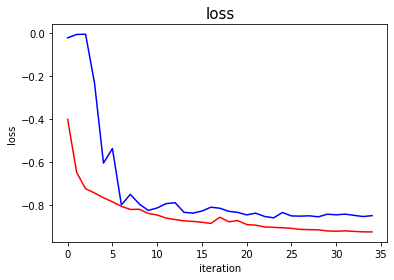

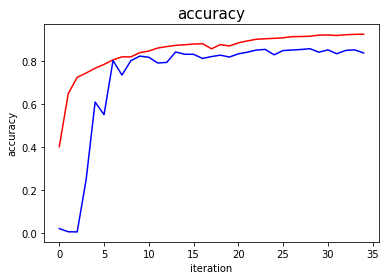

In [ ]:
#plotting the train and validation loss
hist = history.history

list_traindice = hist['dice_coef']
list_testdice = hist['val_dice_coef']

list_trainjaccard = hist['iou']
list_testjaccard = hist['val_iou']

list_trainloss = hist['loss']
list_testloss = hist['val_loss']

plt.figure(1)
plt.plot(list_testloss, 'b-')
plt.plot(list_trainloss,'r-')
plt.xlabel('iteration')
plt.ylabel('loss')
plt.title('loss', fontsize = 15)

plt.figure(2)
plt.plot(list_traindice, 'r-')
plt.plot(list_testdice, 'b-')
plt.xlabel('iteration')
plt.ylabel('accuracy')
plt.title('accuracy', fontsize = 15)
plt.show()

In [ ]:
#saving the history which we get as a result of model.fit
pd.DataFrame.from_dict(history.history).to_csv('history.csv',index=False)

In [ ]:
#load the best model
model = load_model('final_tfd.hdf5', custom_objects={'dice_coef_loss': dice_coef_loss, 'iou': iou, 'dice_coef': dice_coef})
tf.saved_model.save(model, '/content/test_saved_model')

In [ ]:
#creating test dataset
#defining the steps
test_steps = (len(test_x)//32)
if len(test_x) % 32 != 0:
    test_steps += 1

#evaluating the model on the test data and printing the results
results = model.evaluate(test_dataset, steps=test_steps)
print("Test loss: ",results[0])
print("Test IOU: ",results[1])
print("Test Dice Coefficent: ",results[2])

13/13 [==============================] - 3s 198ms/step - loss: -0.8742 - binary_accuracy: 0.9944 - iou: 0.7848 - dice_coef: 0.8781
Test loss:  -0.8742101788520813
Test IOU:  0.9944005012512207
Test Dice Coefficent:  0.7847832441329956


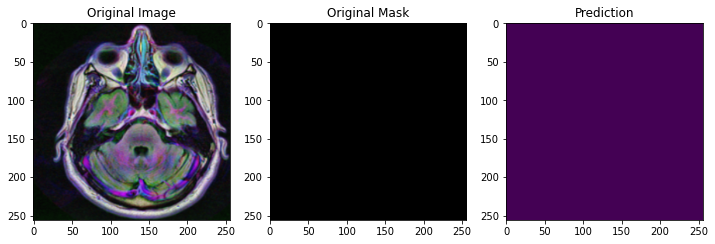

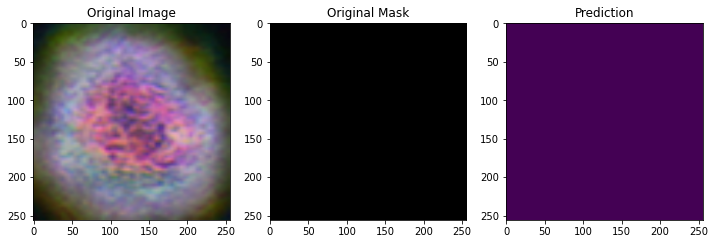

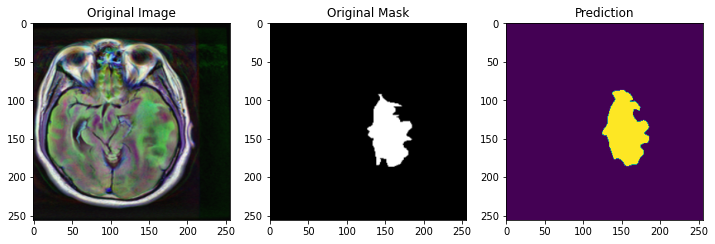

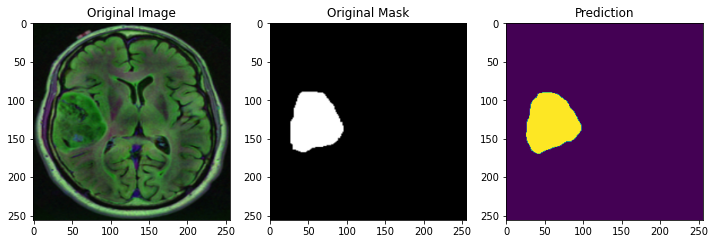

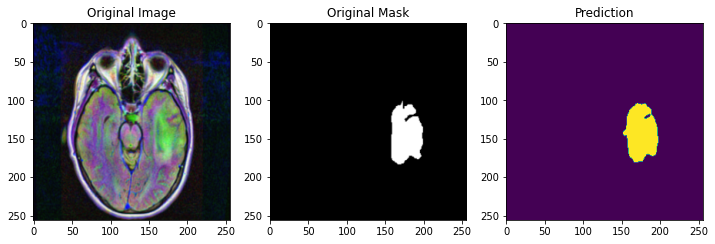

...

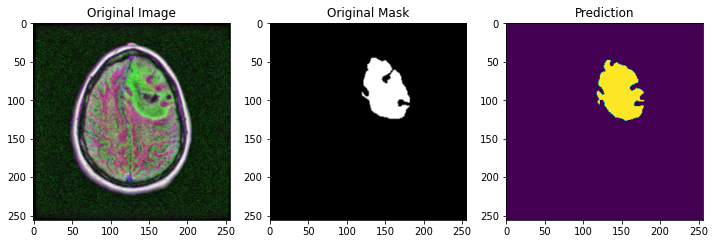

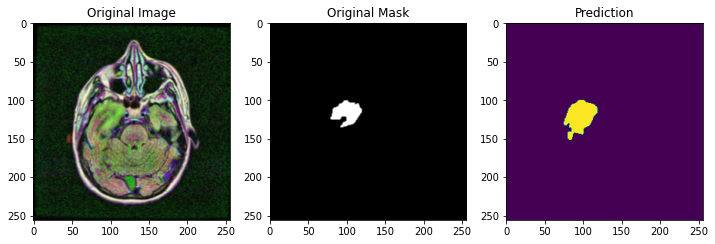

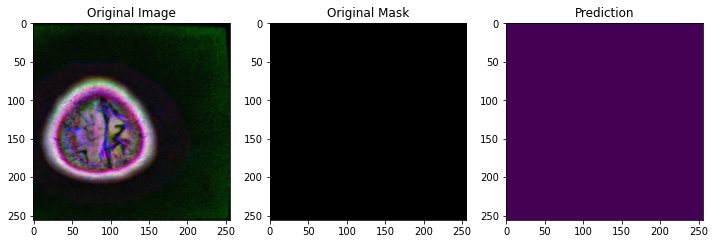

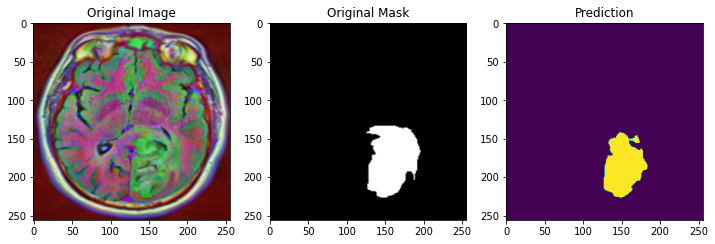

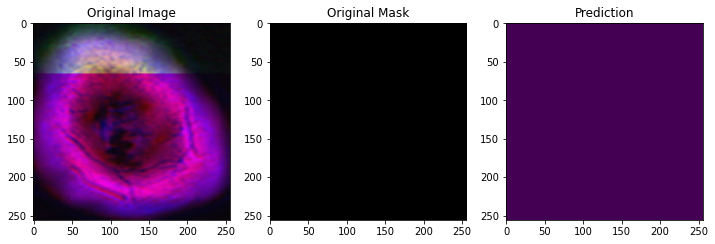

In [ ]:
#visualize the predicted and ground truth mask
#setting the image width and height
im_width = 256
im_height = 256

#set random seed
np.random.seed(1435)

#visualize a total of 15 images
for i in range(15):
    #choose a random image from the test set
    index=np.random.randint(1, len(test_x))
    #read the image
    img = cv2.imread(test_x[index])
    #resize the image
    img = cv2.resize(img ,(im_height, im_width))
    img = img / 255
    img = img[np.newaxis, :, :, :]
    #predict the image
    pred=model.predict(img)

    #plot the original image
    plt.figure(figsize=(12,12))
    plt.subplot(1,3,1)
    plt.imshow(np.squeeze(img))
    plt.title('Original Image')

    #plot the original mask
    plt.subplot(1,3,2)
    img = cv2.imread(test_y[index])
    img = cv2.resize(img, (im_height, im_width))
    plt.imshow(np.squeeze(img))
    plt.title('Original Mask')
    
    #plot the predicted mask
    plt.subplot(1,3,3)
    plt.imshow(np.squeeze(pred) > .5)
    plt.title('Prediction')
    plt.show()
